In [99]:
# Imports
import numpy as np
import pandas as pd
import modin.pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt

#  TASK 1: Load the dataset and demonstrate the successful loading of the dataset by displaying both the top and bottom five rows.

In [100]:
PATH = './data/drug_consumption.csv'  

try:
    df = pd.read_csv(filepath_or_buffer=PATH, header=0)
except FileNotFoundError:
    print("The specified file path does not exist.")
except Exception as e:
    print("An error occurred:", e)
# Source: https://www.kaggle.com/datasets/mexwell/drug-consumption-classification

In [101]:
df.head(n=5)

,ID,Age,Gender,Education,Country,Ethnicity,Nscore,Escore,Oscore,Ascore,...,Ecstasy,Heroin,Ketamine,Legalh,LSD,Meth,Mushrooms,Nicotine,Semer,VSA
0,1,0.49788,0.48246,-0.05921,0.96082,0.12600,0.31287,-0.57545,-0.58331,-0.91699,...,CL0,CL0,CL0,CL0,CL0,CL0,CL0,CL2,CL0,CL0
1,2,-0.07854,-0.48246,1.98437,0.96082,-0.31685,-0.67825,1.93886,1.43533,0.76096,...,CL4,CL0,CL2,CL0,CL2,CL3,CL0,CL4,CL0,CL0
2,3,0.49788,-0.48246,-0.05921,0.96082,-0.31685,-0.46725,0.80523,-0.84732,-1.62090,...,CL0,CL0,CL0,CL0,CL0,CL0,CL1,CL0,CL0,CL0
3,4,-0.95197,0.48246,1.16365,0.96082,-0.31685,-0.14882,-0.80615,-0.01928,0.59042,...,CL0,CL0,CL2,CL0,CL0,CL0,CL0,CL2,CL0,CL0
4,5,0.49788,0.48246,1.98437,0.96082,-0.31685,0.73545,-1.63340,-0.45174,-0.30172,...,CL1,CL0,CL0,CL1,CL0,CL0,CL2,CL2,CL0,CL0


In [102]:
df.tail(n=5)

,ID,Age,Gender,Education,Country,Ethnicity,Nscore,Escore,Oscore,Ascore,...,Ecstasy,Heroin,Ketamine,Legalh,LSD,Meth,Mushrooms,Nicotine,Semer,VSA
1880,1884,-0.95197,0.48246,-0.61113,-0.57009,-0.31685,-1.19430,1.74091,1.88511,0.76096,...,CL0,CL0,CL0,CL3,CL3,CL0,CL0,CL0,CL0,CL5
1881,1885,-0.95197,-0.48246,-0.61113,-0.57009,-0.31685,-0.24649,1.74091,0.58331,0.76096,...,CL2,CL0,CL0,CL3,CL5,CL4,CL4,CL5,CL0,CL0
1882,1886,-0.07854,0.48246,0.45468,-0.57009,-0.31685,1.13281,-1.37639,-1.27553,-1.77200,...,CL4,CL0,CL2,CL0,CL2,CL0,CL2,CL6,CL0,CL0
1883,1887,-0.95197,0.48246,-0.61113,-0.57009,-0.31685,0.91093,-1.92173,0.29338,-1.62090,...,CL3,CL0,CL0,CL3,CL3,CL0,CL3,CL4,CL0,CL0
1884,1888,-0.95197,-0.48246,-0.61113,0.21128,-0.31685,-0.46725,2.12700,1.65653,1.11406,...,CL3,CL0,CL0,CL3,CL3,CL0,CL3,CL6,CL0,CL2


# TASK 2: Provide insights into the dataset by displaying its size and the data types of its columns.

In [103]:
df_dimensions = df.shape
print(f'The dimension of the dataframe is equal to {df_dimensions}, which means we have {df_dimensions[0]} rows and {df_dimensions[1]} columns.')

The dimension of the dataframe is equal to (1885, 32), which means we have 1885 rows and 32 columns.


In [104]:
df_size = df.size
print(f'The size of the dataframe is {df_size}, which is equal to {df_dimensions[0]} rows * {df_dimensions[1]} columns.')

The size of the dataframe is 60320, which is equal to 1885 rows * 32 columns.


In [105]:
# Just in case size is referring to the amount of memory used by the df
df.memory_usage(deep=True) # Return the memory usage of each column in bytes. The memory usage can optionally include the contribution of the index and elements of object dtype.

Index           132
ID            15080
Age           15080
Gender        15080
Education     15080
Country       15080
Ethnicity     15080
Nscore        15080
Escore        15080
Oscore        15080
Ascore        15080
Cscore        15080
Impulsive     15080
SS            15080
Alcohol      113100
Amphet       113100
Amyl         113100
Benzos       113100
Caff         113100
Cannabis     113100
Choc         113100
Coke         113100
Crack        113100
Ecstasy      113100
Heroin       113100
Ketamine     113100
Legalh       113100
LSD          113100
Meth         113100
Mushrooms    113100
Nicotine     113100
Semer        113100
VSA          113100
dtype: int64

In [106]:
df.dtypes # Print all column types

ID             int64
Age          float64
Gender       float64
Education    float64
Country      float64
Ethnicity    float64
Nscore       float64
Escore       float64
Oscore       float64
Ascore       float64
Cscore       float64
Impulsive    float64
SS           float64
Alcohol       object
Amphet        object
Amyl          object
Benzos        object
Caff          object
Cannabis      object
Choc          object
Coke          object
Crack         object
Ecstasy       object
Heroin        object
Ketamine      object
Legalh        object
LSD           object
Meth          object
Mushrooms     object
Nicotine      object
Semer         object
VSA           object
dtype: object

In [107]:
for column in df.columns:
    print(f'Column {column} has type: {df[column].dtype}') # Print single column types

Column ID has type: int64
Column Age has type: float64
Column Gender has type: float64
Column Education has type: float64
Column Country has type: float64
Column Ethnicity has type: float64
Column Nscore has type: float64
Column Escore has type: float64
Column Oscore has type: float64
Column Ascore has type: float64
Column Cscore has type: float64
Column Impulsive has type: float64
Column SS has type: float64
Column Alcohol has type: object
Column Amphet has type: object
Column Amyl has type: object
Column Benzos has type: object
Column Caff has type: object
Column Cannabis has type: object
Column Choc has type: object
Column Coke has type: object
Column Crack has type: object
Column Ecstasy has type: object
Column Heroin has type: object
Column Ketamine has type: object
Column Legalh has type: object
Column LSD has type: object
Column Meth has type: object
Column Mushrooms has type: object
Column Nicotine has type: object
Column Semer has type: object
Column VSA has type: object


# TASK3: Select the required columns and filter out the data you don't need.

In [108]:
print('The df contains the following columns:')
columns_list = list(df.columns)
print(*columns_list, sep=', ') # * will split automatically by a space, separator is defined as ", "

The df contains the following columns:
ID, Age, Gender, Education, Country, Ethnicity, Nscore, Escore, Oscore, Ascore, Cscore, Impulsive, SS, Alcohol, Amphet, Amyl, Benzos, Caff, Cannabis, Choc, Coke, Crack, Ecstasy, Heroin, Ketamine, Legalh, LSD, Meth, Mushrooms, Nicotine, Semer, VSA


In [109]:
# We will only use a subset of the columns, dropping most of the column classes referring to an addiction
# Keep 0-13 as well as 'Alcohol', 'Benzos', 'Cannabis', 'Coke', 'Crack', 'Ecstasy', 'Heroin', 'LSD', 'METH', 'Mushrooms', and 'Nicotine'

# Keep the initial 13 columns
df_reduced = df.iloc[:, 0:13]

# Add the specific drug-related columns by their names
target_columns = ['Alcohol', 'Benzos', 'Cannabis', 'Coke', 'Crack', 'Ecstasy', 'Heroin', 'LSD', 'Meth', 'Mushrooms', 'Nicotine']
df_reduced = df_reduced.join(df[target_columns])

print(df_reduced.columns)
df = df_reduced # renaming

Index(['ID', 'Age', 'Gender', 'Education', 'Country', 'Ethnicity', 'Nscore',
       'Escore', 'Oscore', 'Ascore', 'Cscore', 'Impulsive', 'SS', 'Alcohol',
       'Benzos', 'Cannabis', 'Coke', 'Crack', 'Ecstasy', 'Heroin', 'LSD',
       'Meth', 'Mushrooms', 'Nicotine'],
      dtype='object')


In [110]:
# check which columns contain NaN values
df.isna().any()

ID           False
Age          False
Gender       False
Education    False
Country      False
Ethnicity    False
Nscore       False
Escore       False
Oscore       False
Ascore       False
Cscore       False
Impulsive    False
SS           False
Alcohol      False
Benzos       False
Cannabis     False
Coke         False
Crack        False
Ecstasy      False
Heroin       False
LSD          False
Meth         False
Mushrooms    False
Nicotine     False
dtype: bool

In [111]:
def check_nan(df):
    if df is not None:
        nan_columns = df.columns[df.isna().any()].tolist() # convert result from before into list, since this would not work for a dataset containing a large amount of columns
        if nan_columns:
            print("Columns containing NaN values:", nan_columns)
        else:
            print("No NaN values found in any column.")
    else:
        print("Cannot check for NaN values because the DataFrame is empty.")

In [112]:
# Check for NaN values
check_nan(df)

No NaN values found in any column.


In [113]:
# We are lucky and our dataset does not need to be reduced more, since there are no NAN values present.
# We could use the following command to reduce it further:
# filtered_df = df[df['name'].notnull()] # 'name' is the corresponding column; filters out only rows that does not have any NaN values in 'name' column.

# TASK4: Next, employ a for or while loop to iterate through a specific numeric column, calculating the sum and average of its values. 

In [114]:
for column in df.columns:
    if pd.api.types.is_numeric_dtype(df[column].dtype):
        mean = df[column].mean()
        sum = df[column].sum()
        print(f'Column {column} is numeric. Mean: {mean:.2f}, Sum: {sum:.2f}')
    else:
        print(f'Column {column} is not numeric.')

Column ID is numeric. Mean: 945.29, Sum: 1781881.00
Column Age is numeric. Mean: 0.03, Sum: 65.24
Column Gender is numeric. Mean: -0.00, Sum: -0.48
Column Education is numeric. Mean: -0.00, Sum: -7.17
Column Country is numeric. Mean: 0.36, Sum: 670.20
Column Ethnicity is numeric. Mean: -0.31, Sum: -583.55
Column Nscore is numeric. Mean: 0.00, Sum: 0.09
Column Escore is numeric. Mean: -0.00, Sum: -0.31
Column Oscore is numeric. Mean: -0.00, Sum: -1.01
Column Ascore is numeric. Mean: -0.00, Sum: -0.46
Column Cscore is numeric. Mean: -0.00, Sum: -0.73
Column Impulsive is numeric. Mean: 0.01, Sum: 13.60
Column SS is numeric. Mean: -0.00, Sum: -6.20
Column Alcohol is not numeric.
Column Benzos is not numeric.
Column Cannabis is not numeric.
Column Coke is not numeric.
Column Crack is not numeric.
Column Ecstasy is not numeric.
Column Heroin is not numeric.
Column LSD is not numeric.
Column Meth is not numeric.
Column Mushrooms is not numeric.
Column Nicotine is not numeric.


In [115]:
# Calculating mean and sum for a specific numeric columns
specific_numeric_column = 'Impulsive'
row_counter = 0
row_sum = 0
row_mean = 0

# Using a loop operation as requested
for index, row in df.iterrows():
    row_counter += 1
    row_sum += row[specific_numeric_column]
    
row_mean = row_sum / row_counter
print(f'Column `{specific_numeric_column}` has a total of {row_counter} elements, a sum of {row_sum:.2f} and a mean of {row_mean:.2f}.')

Column `Impulsive` has a total of 1885 elements, a sum of 13.60 and a mean of 0.01.


# TASK5: Utilise another loop to iterate through string columns if they exist, converting all values to lowercase for consistency or counting the group value. 

In [116]:
for column in df.columns:
    if pd.api.types.is_string_dtype(df[column].dtype):
        # Convert all values in the column to lowercase for consistency
        df[column] = df[column].str.lower()
        
        # Optional: display or analyze the frequency of values
        value_counts = df[column].value_counts()
        print(f'Column {column} contains string values. Value counts:')
        print(value_counts)
    else:
        print(f'Column {column} does not contain  string values.')

Column ID does not contain  string values.
Column Age does not contain  string values.
Column Gender does not contain  string values.
Column Education does not contain  string values.
Column Country does not contain  string values.
Column Ethnicity does not contain  string values.
Column Nscore does not contain  string values.
Column Escore does not contain  string values.
Column Oscore does not contain  string values.
Column Ascore does not contain  string values.
Column Cscore does not contain  string values.
Column Impulsive does not contain  string values.
Column SS does not contain  string values.
Column Alcohol contains string values. Value counts:
Alcohol
cl5    759
cl6    505
cl4    287
cl3    198
cl2     68
cl1     34
cl0     34
Name: count, dtype: int64
Column Benzos contains string values. Value counts:
Benzos
cl0    1000
cl3     236
cl2     234
cl4     120
cl1     116
cl6      95
cl5      84
Name: count, dtype: int64
Column Cannabis contains string values. Value counts:
Can

# TASK6: Explore the dataset comprehensively by generating summary statistics, including frequency, mean, median, standard deviation, minimum, maximum, and quartiles. 

In [117]:
# Initial data exploration
df.describe()

,ID,Age,Gender,Education,Country,Ethnicity,Nscore,Escore,Oscore,Ascore,Cscore,Impulsive,SS
count,1885.000000,1885.00000,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000,1885.000000
mean,945.294960,0.03461,-0.000256,-0.003806,0.355542,-0.309577,0.000047,-0.000163,-0.000534,-0.000245,-0.000386,0.007216,-0.003292
std,545.167641,0.87836,0.482588,0.950078,0.700335,0.166226,0.998106,0.997448,0.996229,0.997440,0.997523,0.954435,0.963701
min,1.000000,-0.95197,-0.482460,-2.435910,-0.570090,-1.107020,-3.464360,-3.273930,-3.273930,-3.464360,-3.464360,-2.555240,-2.078480
25%,474.000000,-0.95197,-0.482460,-0.611130,-0.570090,-0.316850,-0.678250,-0.695090,-0.717270,-0.606330,-0.652530,-0.711260,-0.525930
50%,946.000000,-0.07854,-0.482460,-0.059210,0.960820,-0.316850,0.042570,0.003320,-0.019280,-0.017290,-0.006650,-0.217120,0.079870
75%,1417.000000,0.49788,0.482460,0.454680,0.960820,-0.316850,0.629670,0.637790,0.723300,0.760960,0.584890,0.529750,0.765400
max,1888.000000,2.59171,0.482460,1.984370,0.960820,1.907250,3.273930,3.273930,2.901610,3.464360,3.464360,2.901610,1.921730


In [118]:
# Advanced data exploration

# Container for statistics
numeric_stats = {}
non_numeric_stats = {}

for column in df.columns:
    data = df[column]

    # Check if the column is numeric
    if pd.api.types.is_numeric_dtype(data):
        # Descriptive statistics for numeric data
        stats = {
            # Frequency not really suitable for  numeric data
            'Count': data.count(), 
            'Mean': data.mean(),
            'Median': data.median(),
            'Standard Deviation': data.std(),
            'Minimum': data.min(),
            'Maximum': data.max(),
            '25%': data.quantile(0.25),
            '50%': data.quantile(0.50),
            '75%': data.quantile(0.75),
            'Missing Values': data.isna().sum(),
            'Unique Values': data.nunique()
        }
        numeric_stats[column] = stats
    else:
        # Descriptive statistics for categorical data
        stats = {
            'Count of Occurrences': data.value_counts(), # frequency
            'Missing Values': data.isna().sum(),
            'Unique Values': data.nunique()
        }
        non_numeric_stats[column] = stats

In [119]:
# Printing the statistics for numeric columns
print("Numeric Columns Statistics:")
for column, stats in numeric_stats.items():
    print(f"\nStatistics for {column}:")
    for key, value in stats.items():
        print(f"{key}: {value}")

Numeric Columns Statistics:

Statistics for ID:
Count: 1885
Mean: 945.2949602122015
Median: 946.0
Standard Deviation: 545.1676410988996
Minimum: 1
Maximum: 1888
25%: 474.0
50%: 946.0
75%: 1417.0
Missing Values: 0
Unique Values: 1885

Statistics for Age:
Count: 1885
Mean: 0.03460995225464192
Median: -0.07854
Standard Deviation: 0.8783603244968189
Minimum: -0.95197
Maximum: 2.59171
25%: -0.95197
50%: -0.07854
75%: 0.49788
Missing Values: 0
Unique Values: 6

Statistics for Gender:
Count: 1885
Mean: -0.0002559469496021218
Median: -0.48246
Standard Deviation: 0.48258795650669223
Minimum: -0.48246
Maximum: 0.48246
25%: -0.48246
50%: -0.48246
75%: 0.48246
Missing Values: 0
Unique Values: 2

Statistics for Education:
Count: 1885
Mean: -0.003806090185676411
Median: -0.05921
Standard Deviation: 0.9500782517816263
Minimum: -2.43591
Maximum: 1.98437
25%: -0.61113
50%: -0.05921
75%: 0.45468
Missing Values: 0
Unique Values: 9

Statistics for Country:
Count: 1885
Mean: 0.3555421697612732
Median: 0.96

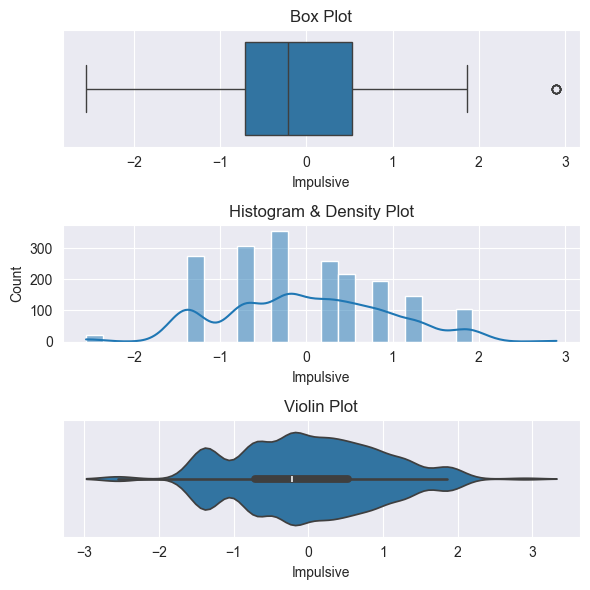

In [120]:
# Plotting of some statistics for the numerical column 'Impulsive'
fig, ax = plt.subplots(3, 1, figsize=(6, 6))

# First plot: Box Plot
sns.boxplot(x=df['Impulsive'], ax=ax[0])
ax[0].set_title('Box Plot')

# Second plot: Histogram & Density Plot
sns.histplot(df['Impulsive'], kde=True, ax=ax[1])
ax[1].set_title('Histogram & Density Plot')

# Third plot: Violin Plot
sns.violinplot(x=df['Impulsive'], ax=ax[2])
ax[2].set_title('Violin Plot')

plt.tight_layout()
plt.show()

In [121]:
# Printing the statistics for non-numeric columns
print("Non-Numeric Columns Statistics:")
for column, stats in non_numeric_stats.items():
    print(f"Statistics for {column}:")
    if isinstance(stats['Count of Occurrences'], pd.Series):
        print("Count of Occurrences:")
        print(stats['Count of Occurrences'])
    for key, value in stats.items():
        if key != 'Count of Occurrences':
            print(f"{key}: {value}")

Non-Numeric Columns Statistics:
Statistics for Alcohol:
Count of Occurrences:
Alcohol
cl5    759
cl6    505
cl4    287
cl3    198
cl2     68
cl1     34
cl0     34
Name: count, dtype: int64
Missing Values: 0
Unique Values: 7
Statistics for Benzos:
Count of Occurrences:
Benzos
cl0    1000
cl3     236
cl2     234
cl4     120
cl1     116
cl6      95
cl5      84
Name: count, dtype: int64
Missing Values: 0
Unique Values: 7
Statistics for Cannabis:
Count of Occurrences:
Cannabis
cl6    463
cl0    413
cl2    266
cl3    211
cl1    207
cl5    185
cl4    140
Name: count, dtype: int64
Missing Values: 0
Unique Values: 7
Statistics for Coke:
Count of Occurrences:
Coke
cl0    1038
cl2     270
cl3     258
cl1     160
cl4      99
cl5      41
cl6      19
Name: count, dtype: int64
Missing Values: 0
Unique Values: 7
Statistics for Crack:
Count of Occurrences:
Crack
cl0    1627
cl2     112
cl1      67
cl3      59
cl5       9
cl4       9
cl6       2
Name: count, dtype: int64
Missing Values: 0
Unique Values:

Text(0.5, 1.0, 'Frequency Count for Categorical Attribute Alcohol')

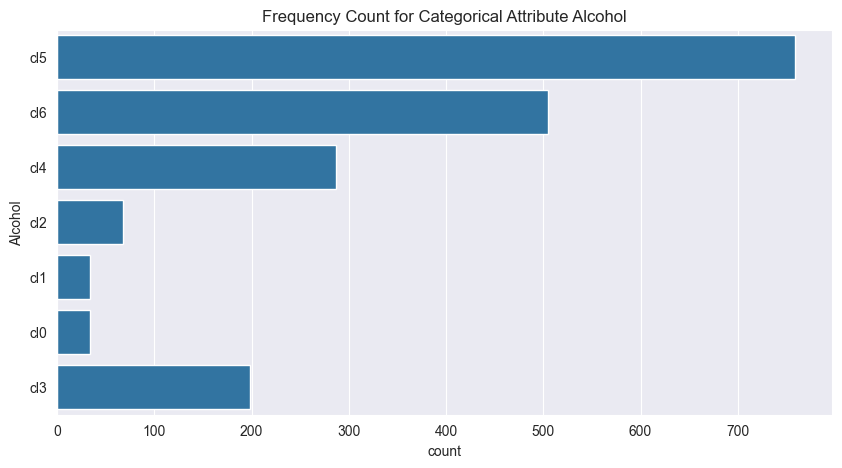

In [122]:
# Plotting of some statistics for the numerical categorical 'Alcohol'
plt.figure(figsize=(10, 5))
sns.countplot(y=df['Alcohol'])
plt.title(label=f'Frequency Count for Categorical Attribute Alcohol')

# TASK7: Generate the correlation table between the numerical columns.

In [123]:
# Select only the numeric columns before calculating the correlation
numeric_df = df.select_dtypes(include=[np.number])
correlation_matrix = numeric_df.corr()

# Display the correlation matrix
print(correlation_matrix)

                 ID       Age    Gender  Education   Country  Ethnicity  \
ID         1.000000 -0.271395 -0.025467  -0.025253 -0.340751   0.059309   
Age       -0.271395  1.000000  0.110286   0.158811  0.354241  -0.069753   
Gender    -0.025467  0.110286  1.000000   0.196774  0.216271  -0.001213   
Education -0.025253  0.158811  0.196774   1.000000  0.225311  -0.036099   
Country   -0.340751  0.354241  0.216271   0.225311  1.000000  -0.127946   
Ethnicity  0.059309 -0.069753 -0.001213  -0.036099 -0.127946   1.000000   
Nscore     0.018639 -0.136654  0.074646  -0.100993 -0.136191   0.047642   
Escore    -0.046960 -0.033849  0.057864   0.115645  0.109524   0.018402   
Oscore     0.173565 -0.226778 -0.131021   0.057994 -0.341969   0.084816   
Ascore    -0.028782  0.063504  0.219743   0.091088  0.150921  -0.038726   
Cscore    -0.072094  0.183564  0.183831   0.240417  0.214000  -0.029923   
Impulsive  0.119663 -0.190939 -0.167492  -0.132482 -0.231572   0.082411   
SS         0.165882 -0.33

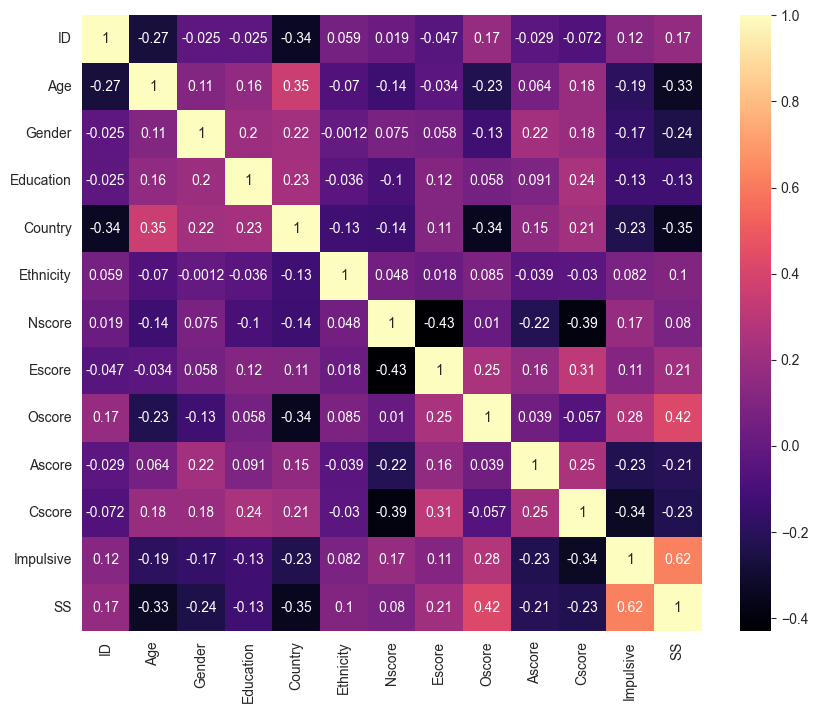

In [124]:
# Simple heatmap visualization

# Set the size of the figure
plt.figure(figsize=(10, 8))  # You can adjust the dimensions as needed

# Create the heatmap using the 'magma' color scheme
sns.heatmap(correlation_matrix, annot=True, cmap='magma')

# Show the plot
plt.show()

# TASK8: Lastly, identify duplicate columns and rows. 

In [125]:
# Find duplicate rows
duplicate_rows = df.duplicated()

In [126]:
# Displaying duplicate rows
print("Duplicate Rows:")
print(df[duplicate_rows])

Duplicate Rows:
Empty DataFrame
Columns: [ID, Age, Gender, Education, Country, Ethnicity, Nscore, Escore, Oscore, Ascore, Cscore, Impulsive, SS, Alcohol, Benzos, Cannabis, Coke, Crack, Ecstasy, Heroin, LSD, Meth, Mushrooms, Nicotine]
Index: []

[0 rows x 24 columns]


In [127]:
# We did not find any duplicated rows

In [128]:
# Function to find duplicate columns
def get_duplicate_columns(df):
    # Apply Trick: Transpose the DataFrame to swap rows and columns
    transposed_df = df.T
    # Find duplicate columns by treating them as duplicate rows in the transposed DataFrame
    duplicate_columns = transposed_df.duplicated()
    # Get names of duplicate columns
    duplicates = duplicate_columns[duplicate_columns].index
    return duplicates

# Finding duplicate columns
duplicate_columns = get_duplicate_columns(df)

In [129]:
duplicate_columns.to_list()

[]

In [130]:
# We did not find any duplicated columns

# TASK9: Display the count and percentage of null values in the dataset, providing a comprehensive overview of its integrity and completeness.

In [131]:
# Prepare data for the plot
complete_data = []
for column in df.columns:
    total_count = len(df[column])
    missing_count = df[column].isna().sum()
    missing_percentage = (missing_count / total_count) * 100
    complete_percentage = 1 - missing_percentage
    complete_data.append({'Column': column, 'Complete Percentage': complete_percentage})

    print(f"Column: {column}")
    print(f"    Total Count: {total_count}")
    print(f"    Missing Values: {missing_count} ({missing_percentage:.2f}%)")
    print("--------------------------------------------")

Column: ID
    Total Count: 1885
    Missing Values: 0 (0.00%)
--------------------------------------------
Column: Age
    Total Count: 1885
    Missing Values: 0 (0.00%)
--------------------------------------------
Column: Gender
    Total Count: 1885
    Missing Values: 0 (0.00%)
--------------------------------------------
Column: Education
    Total Count: 1885
    Missing Values: 0 (0.00%)
--------------------------------------------
Column: Country
    Total Count: 1885
    Missing Values: 0 (0.00%)
--------------------------------------------
Column: Ethnicity
    Total Count: 1885
    Missing Values: 0 (0.00%)
--------------------------------------------
Column: Nscore
    Total Count: 1885
    Missing Values: 0 (0.00%)
--------------------------------------------
Column: Escore
    Total Count: 1885
    Missing Values: 0 (0.00%)
--------------------------------------------
Column: Oscore
    Total Count: 1885
    Missing Values: 0 (0.00%)
-------------------------------------

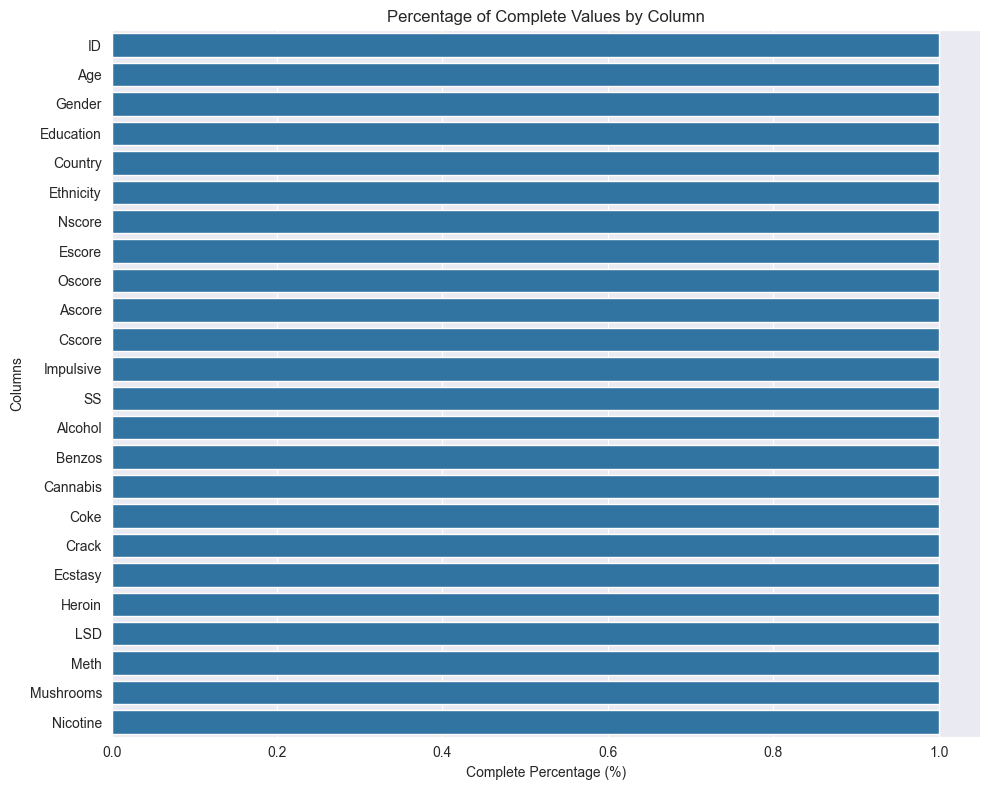

In [132]:
# Convert the list of dictionaries into a DataFrame for plotting
complete_df = pd.DataFrame(complete_data)

# Plotting
plt.figure(figsize=(10, 8))  # Adjust the size as needed
sns.barplot(x='Complete Percentage', y='Column', data=complete_df)
plt.title('Percentage of Complete Values by Column')
plt.xlabel('Complete Percentage (%)')
plt.ylabel('Columns')
plt.tight_layout() 
plt.show()

# Advanced Visualizations

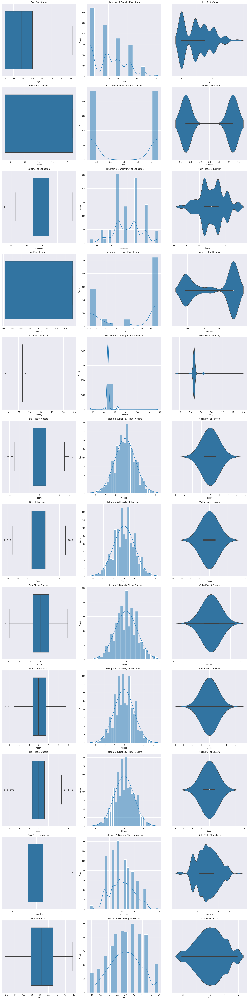

In [133]:
# Get the list of numeric columns
numeric_columns = numeric_df.columns.tolist()

# Remove ID column since this is not considered to be an attribute
numeric_columns.remove('ID')

# Set up the subplots grid
num_plots = len(numeric_columns)
num_cols = 3  # Three types of plots for each column: Box, Histogram & Density, Violin

# Calculate the number of rows needed for all types of plots for each column
num_rows = len(numeric_columns)  # One row for each column type of plot

fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * 6, num_rows * 6))

# Flatten the axes array to make iteration easier
axes = axes.flatten()

# Iterate over each numeric column and plot each type in a separate cell
for i, col in enumerate(numeric_columns):
    # Box Plot
    sns.boxplot(x=df[col], ax=axes[i * num_cols])
    axes[i * num_cols].set_title(f'Box Plot of {col}')

    # Histogram & Density Plot
    sns.histplot(df[col], kde=True, ax=axes[i * num_cols + 1])
    axes[i * num_cols + 1].set_title(f'Histogram & Density Plot of {col}')

    # Violin Plot
    sns.violinplot(x=df[col], ax=axes[i * num_cols + 2])
    axes[i * num_cols + 2].set_title(f'Violin Plot of {col}')

# Adjust layout
plt.tight_layout()

# Show plots
plt.show()


In [134]:
df.columns

Index(['ID', 'Age', 'Gender', 'Education', 'Country', 'Ethnicity', 'Nscore',
       'Escore', 'Oscore', 'Ascore', 'Cscore', 'Impulsive', 'SS', 'Alcohol',
       'Benzos', 'Cannabis', 'Coke', 'Crack', 'Ecstasy', 'Heroin', 'LSD',
       'Meth', 'Mushrooms', 'Nicotine'],
      dtype='object')

In [135]:
# Selecting columns related to addictions
addiction_columns = [
    'Alcohol', 'Benzos', 'Cannabis', 'Coke',
    'Crack', 'Ecstasy', 'Heroin', 'LSD',
    'Meth', 'Mushrooms', 'Nicotine']

In [136]:
# Mapping categories based on source
usage_categories = {
    'CL0': 'Never Used',
    'CL1': 'Used over a Decade Ago',
    'CL2': 'Used in Last Decade',
    'CL3': 'Used in Last Year',
    'CL4': 'Used in Last Month',
    'CL5': 'Used in Last Week',
    'CL6': 'Used in Last Day'
}

In [137]:
# Explicitly define the order of the target column values
category_order = ['cl0', 'cl1', 'cl2', 'cl3', 'cl4', 'cl5', 'cl6']

In [138]:
df.columns

Index(['ID', 'Age', 'Gender', 'Education', 'Country', 'Ethnicity', 'Nscore',
       'Escore', 'Oscore', 'Ascore', 'Cscore', 'Impulsive', 'SS', 'Alcohol',
       'Benzos', 'Cannabis', 'Coke', 'Crack', 'Ecstasy', 'Heroin', 'LSD',
       'Meth', 'Mushrooms', 'Nicotine'],
      dtype='object')

In [139]:
numeric_columns

['Age',
 'Gender',
 'Education',
 'Country',
 'Ethnicity',
 'Nscore',
 'Escore',
 'Oscore',
 'Ascore',
 'Cscore',
 'Impulsive',
 'SS']

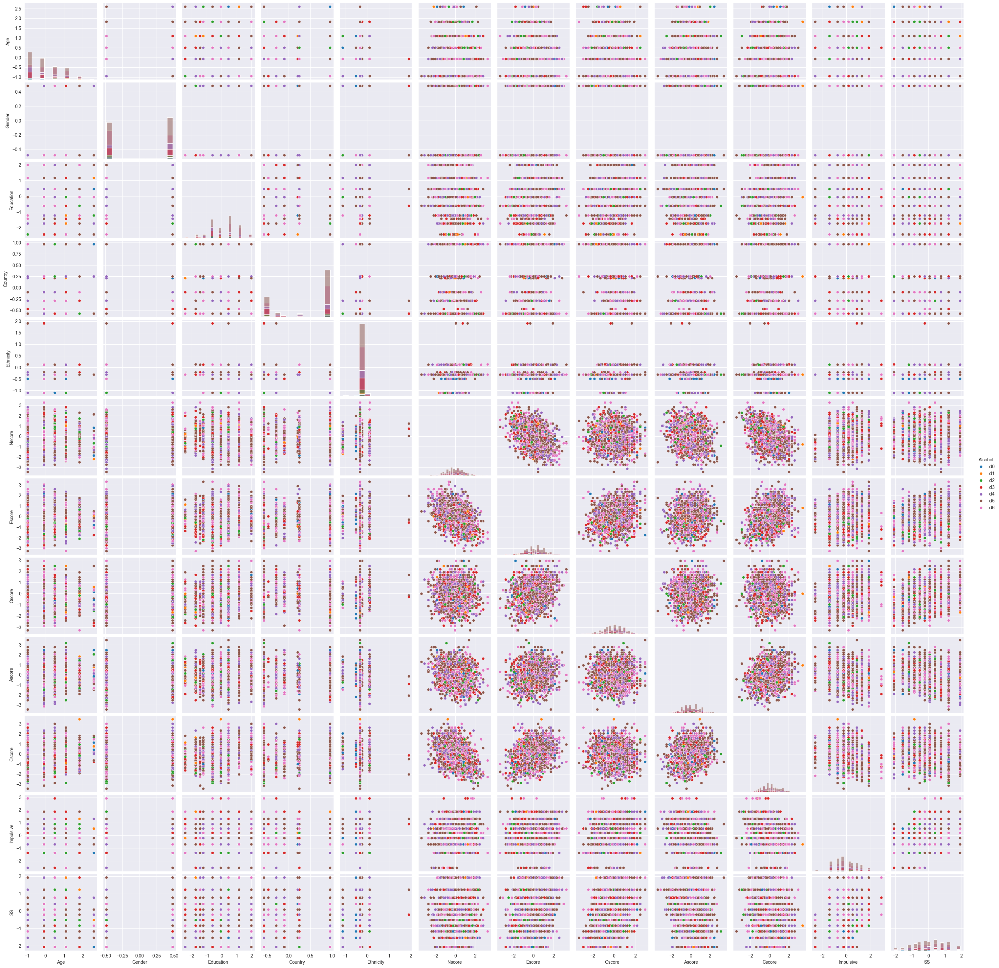

In [140]:
# Pairplot with 'Alcohol' as hue
sns.pairplot(df, vars=numeric_columns, hue='Alcohol', hue_order=category_order, diag_kind='hist')
plt.show()

In [141]:
### Divided into two groups as an example. This is for illustrative purposes and does not reflect my competence as an addiction counselor.

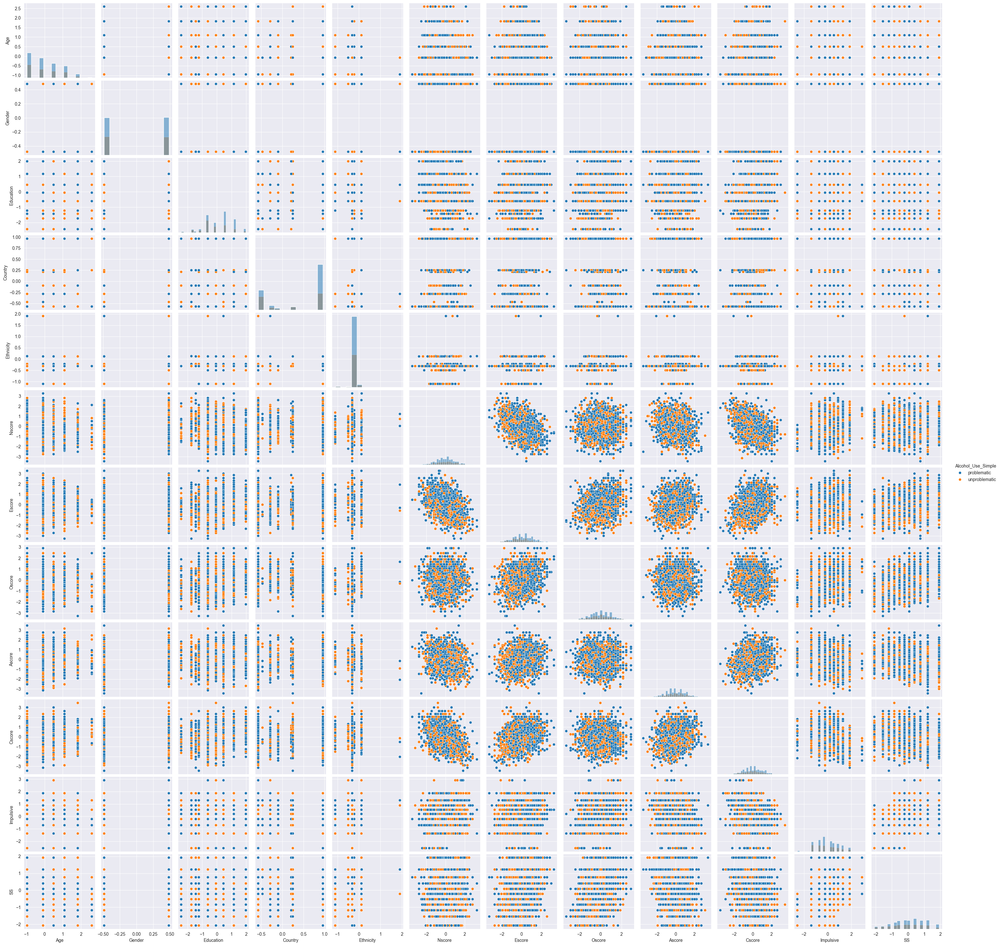

In [142]:
# Create a new column 'Alcohol_Use_Simple' that categorizes alcohol usage into 'unproblematic' and 'problematic'
df['Alcohol_Use_Simple'] = df['Alcohol'].map(lambda x: 'unproblematic' if x in ['cl0', 'cl1', 'cl2', 'cl3', 'cl4'] else 'problematic')

# Pairplot using 'Alcohol_Use_Simple' as hue
sns.pairplot(df, vars=numeric_columns, hue='Alcohol_Use_Simple', diag_kind='hist')
plt.show()

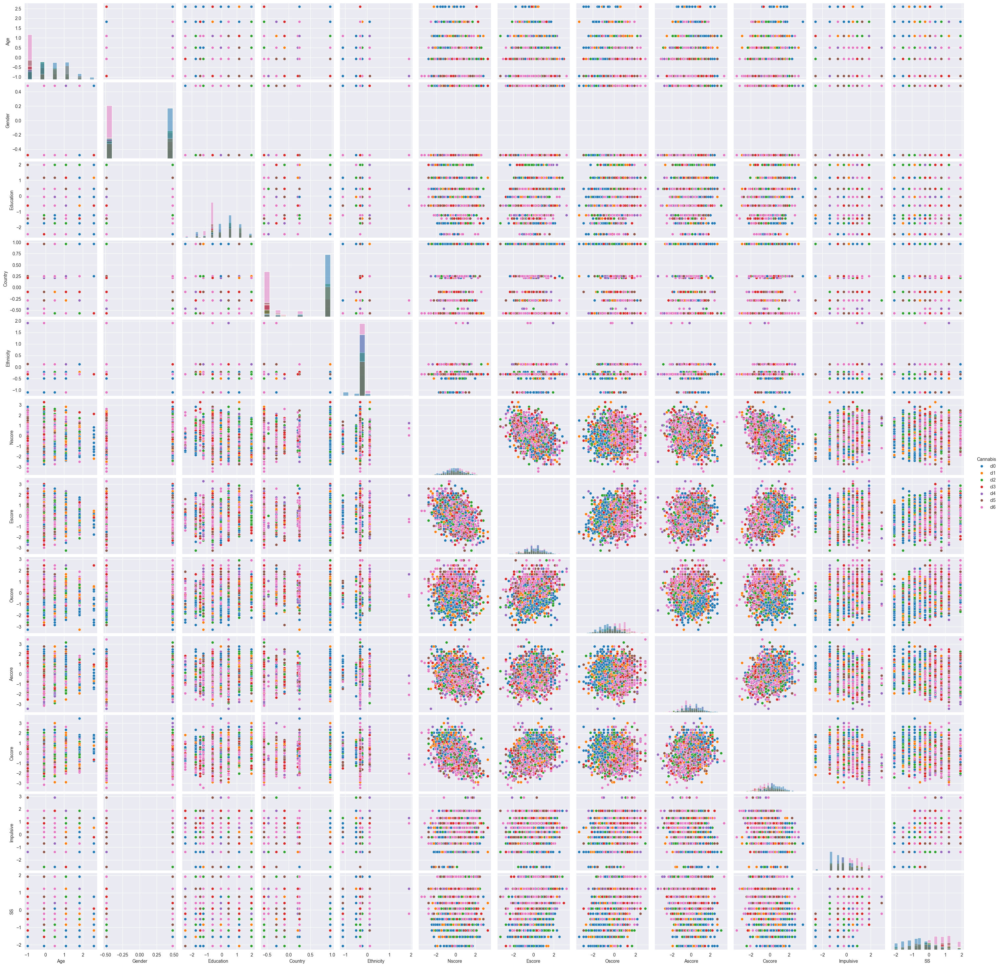

In [143]:
# Pairplot with 'Cannabis' as hue
sns.pairplot(df, vars=numeric_columns, hue='Cannabis', hue_order=category_order, diag_kind='hist')
plt.show()

In [144]:
### Divided into two groups as an example. This is for illustrative purposes and does not reflect my competence as an addiction counselor.

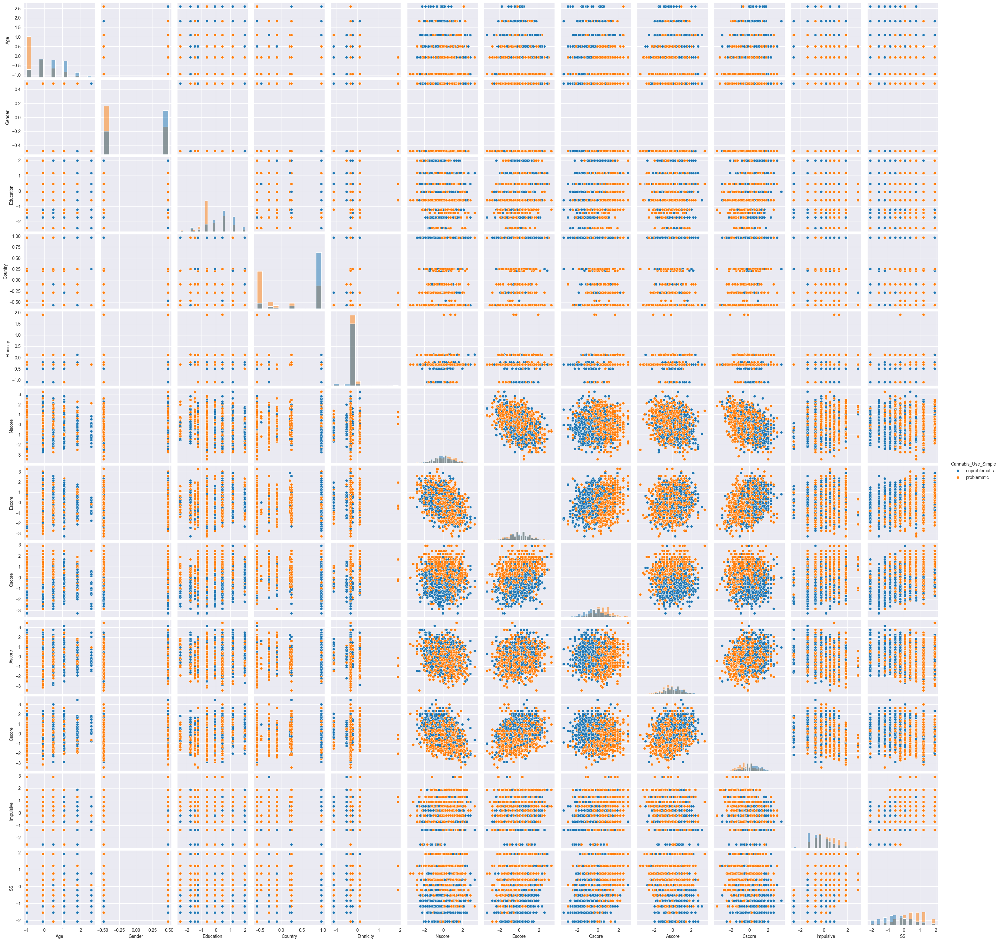

In [145]:
# Create a new column 'Cannabis_Use_simple' that categorizes alcohol usage into 'unproblematic' and 'problematic'
df['Cannabis_Use_Simple'] = df['Cannabis'].map(lambda x: 'unproblematic' if x in ['cl0', 'cl1', 'cl2'] else 'problematic')

# Pairplot using 'Canabis_Use_Simple' as hue
sns.pairplot(df, vars=numeric_columns, hue='Cannabis_Use_Simple', diag_kind='hist')
plt.show()